In [1]:
%matplotlib inline

In [2]:
import numpy as np
import pylab as plt
import cv2

In [27]:
data_0_orig = np.loadtxt('data_0.txt', dtype='float32')
data_180_orig = np.loadtxt('data_180.txt', dtype='float32')

In [14]:
def grad(x):
    return np.sqrt((np.diff(x, axis=0)**2)[:,:-1]+(np.diff(x, axis=1)**2)[:-1,:])

In [28]:
data_0 = cv2.medianBlur(data_0_orig,5)
data_180 = cv2.medianBlur(data_180_orig,5)

In [29]:
data_0 = grad(data_0)
data_180 = grad(data_180)

In [17]:
# thr_up = np.percentile(data_0 [:],99.9)
# # thr_low = np.percentile(data_0 [:],70.0)
# data_0[data_0 > thr_up]= thr_up
# # data_0[data_0 < thr_low]= thr_low

# thr_up = np.percentile(data_180 [:],99.9)
# # thr_low = np.percentile(data_180 [:],70.0)
# data_180[data_180 > thr_up]= thr_up
# # data_180[data_180 < thr_low]= thr_low

In [18]:
def cv_rotate(x, angle):
    """
    Rotate square array using OpenCV2 around center of the array
    :param x: 2d numpy array
    :param angle: angle in degrees
    :return: rotated array
    """
    x_center = tuple(
        np.array((x.shape[1], x.shape[0]), dtype='float32') / 2.0 - 0.5)
    rot_mat = cv2.getRotationMatrix2D(x_center, angle, 1.0)
    xro = cv2.warpAffine(
        x, rot_mat, (x.shape[1], x.shape[0]), flags=cv2.INTER_LINEAR)
    return xro

In [30]:
from scipy.optimize import minimize
def f(x):
    alfa= x[0]
    shift = int(x[1])
    if shift >= 0:
        t = enp.fliplr(cv_rotate(data_180[:,shift:],alfa))-cv_rotate(data_0[:,shift:],alfa)
    else:
        t = np.fliplr(cv_rotate(data_180[:,:shift],alfa))-cv_rotate(data_0[:,shift],alfa)
        
    res = np.sum(t*t)/np.prod(t.shape)
    return res

def corr(x):
    alfa= x[0]*10.
    shift_x = int(x[1])
    if shift_x >= 0:
        t_180 = data_180[:,shift_x:]
        t_0 = data_0[:,shift_x:]
    else:
        t_180 = data_180[:,:shift_x]
        t_0 = data_0[:,:shift_x]
        
    shift_y = int(x[2])//10
    if shift_y > 0:
        t_180 = t_180[shift_y:,:]
        t_0 = t_0[:-shift_y,:]
    elif shift_y < 0:
        t_180 = t_180[:shift_y,:]
        t_0 = t_0[-shift_y:,:]
    
    
#     t_mask = np.zeros_like(t_0)
#     shape_min = np.min(t_mask.shape)
#     r_mask = shape_min//2
#     X,Y = np.meshgrid(np.arange(t_mask.shape[1])-t_mask.shape[1]//2,
#                       np.arange(t_mask.shape[0])-t_mask.shape[0]//2)
#     t_mask = X**2+Y**2<r_mask**2    
    
    tt_180 = np.fliplr(cv_rotate(t_180,alfa))
    tt_180 = cv2.medianBlur(tt_180,5) #*t_mask
    tt_0 = cv_rotate(t_0,alfa)
    tt_0 = cv2.medianBlur(tt_0,5) #*t_mask
#     res = -np.correlate(tt_0.flat,tt_180.flat)
    res = np.sum((tt_0-tt_180)**2)

#     TODO: add mask support 
    return res

x0 = [0.1,-355,30]
res= minimize(corr, x0, method='Nelder-Mead')
print res

 final_simplex: (array([[ -3.83850851e-04,  -1.45591348e+02,   5.78744662e+01],
       [ -3.83846817e-04,  -1.45591363e+02,   5.78744562e+01],
       [ -3.83847087e-04,  -1.45591294e+02,   5.78744906e+01],
       [ -3.83845250e-04,  -1.45591338e+02,   5.78744708e+01]]), array([ 95.53426361,  95.53426361,  95.53426361,  95.53426361]))
           fun: 95.534263610839844
       message: 'Optimization terminated successfully.'
          nfev: 192
           nit: 91
        status: 0
       success: True
             x: array([ -3.83850851e-04,  -1.45591348e+02,   5.78744662e+01])


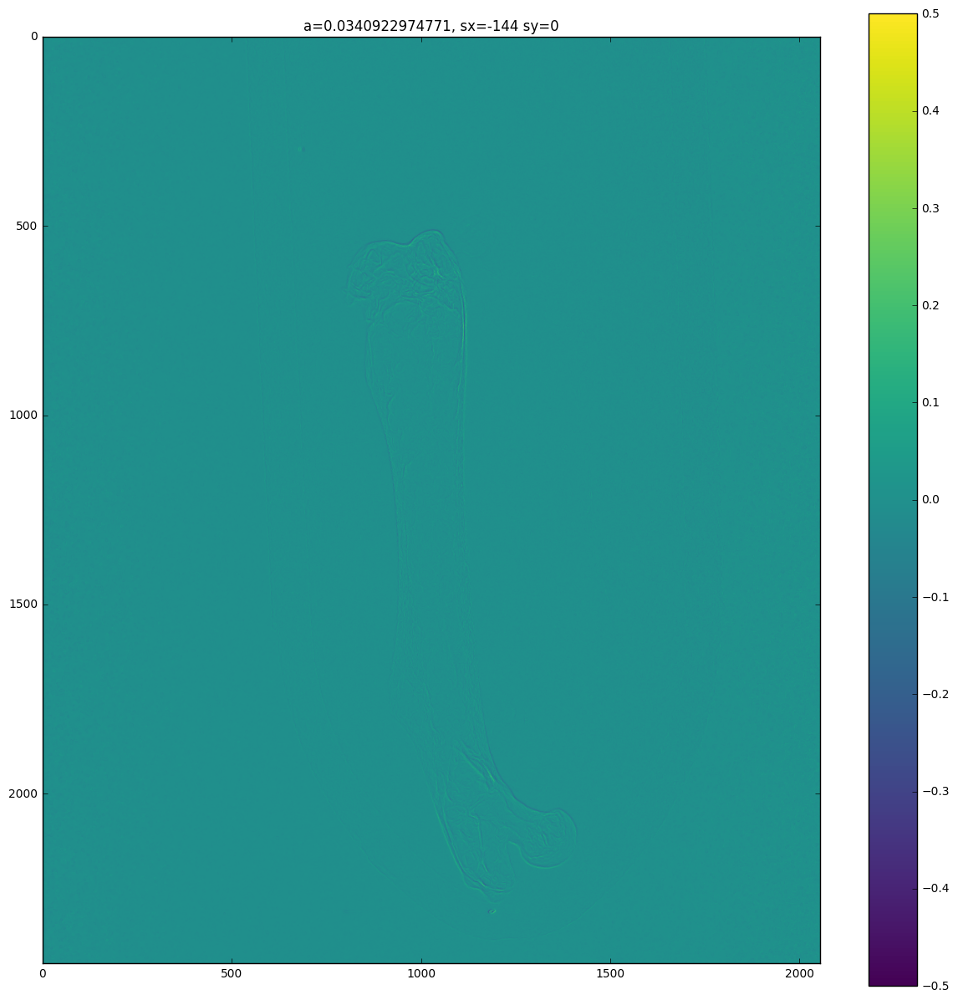

In [26]:
alfa, shift_x, shift_y = res.x[0]*10., int(res.x[1]), int(res.x[2])//10

if shift_x >= 0:
    t_180 = data_180[:,shift_x:]
    t_0 = data_0[:,shift_x:]
else:
    t_180 = data_180[:,:shift_x]
    t_0 = data_0[:,:shift_x]

if shift_y > 0:
    t_180 = t_180[shift_y:,:]
    t_0 = t_0[:-shift_y,:]
elif shift_y < 0:
    t_180 = t_180[:shift_y,:]
    t_0 = t_0[-shift_y:,:]
    
    
tt_180 = np.fliplr(cv_rotate(t_180,alfa))
tt_0 = cv_rotate(t_0,alfa)
    
plt.figure(figsize=(15,15))
plt.imshow(tt_180-tt_0, cmap=plt.cm.viridis, vmin=-0.5, vmax=0.5)
plt.title('a={}, sx={} sy={}'.format(alfa,shift_x, shift_y))
plt.colorbar()
plt.show()

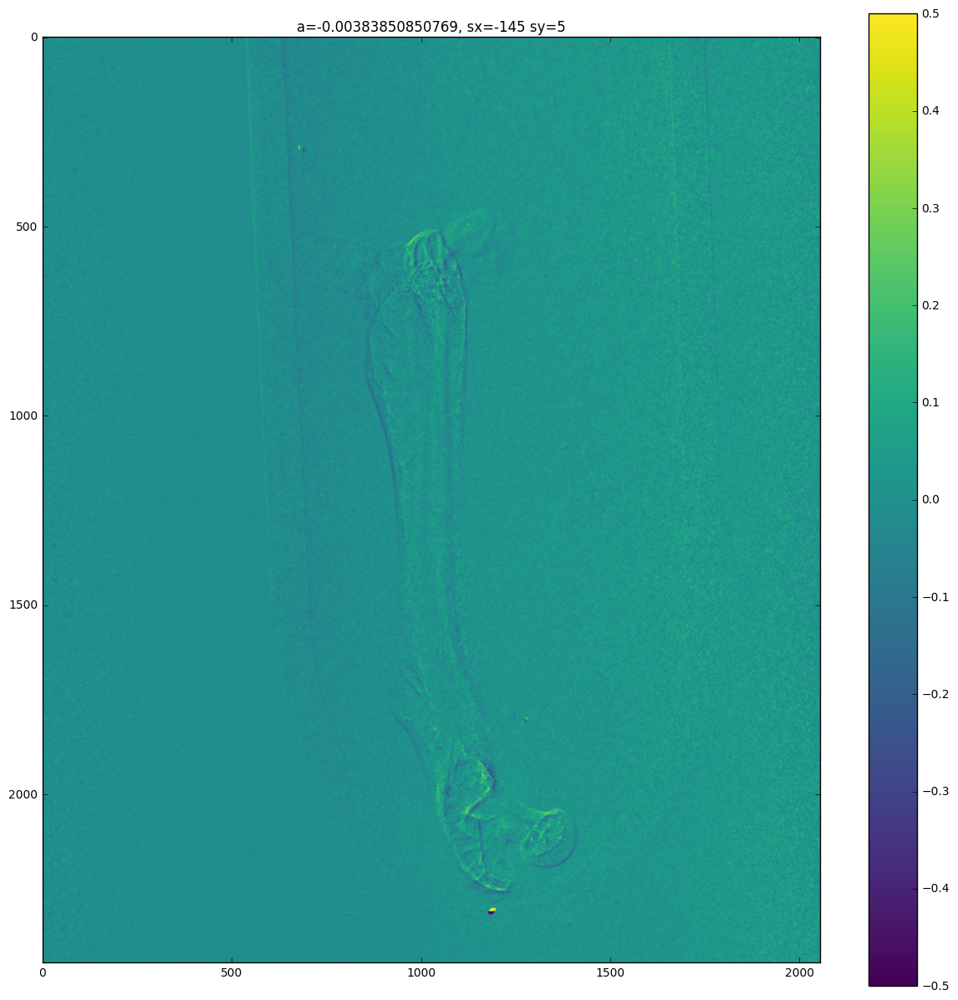

In [149]:
alfa, shift_x, shift_y = res.x[0]*10., int(res.x[1]), int(res.x[2])//10

if shift_x >= 0:
    t_180 = data_180_orig[:,shift_x:]
    t_0 = data_0_orig[:,shift_x:]
else:
    t_180 = data_180_orig[:,:shift_x]
    t_0 = data_0_orig[:,:shift_x]

if shift_y > 0:
    t_180 = t_180[shift_y:,:]
    t_0 = t_0[:-shift_y,:]
elif shift_y < 0:
    t_180 = t_180[:shift_y,:]
    t_0 = t_0[-shift_y:,:]
    
    
tt_180 = np.fliplr(cv_rotate(t_180,alfa))
tt_0 = cv_rotate(t_0,alfa)
    
plt.figure(figsize=(15,15))
plt.imshow(tt_180-tt_0, cmap=plt.cm.viridis, vmin=-0.5, vmax=0.5)
plt.title('a={}, sx={} sy={}'.format(alfa,shift_x, shift_y))
plt.colorbar()
plt.show()

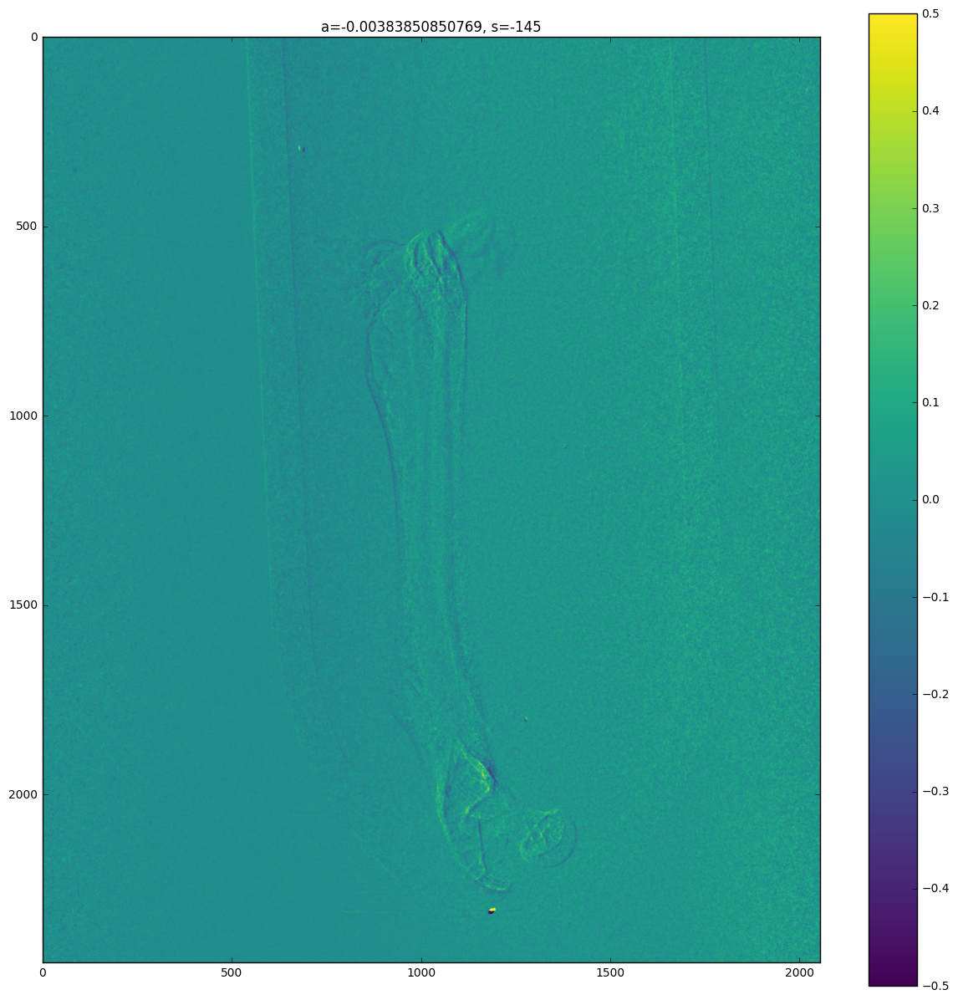

In [150]:
alfa, shift = res.x[0]*10., int(res.x[1])

if shift >= 0:
    t_180 = data_180_orig[:,shift:]
    t_0 = data_0_orig[:,shift:]
else:
    t_180 = data_180_orig[4:,:shift]
    t_0 = data_0_orig[:-4,:shift]
    
tt_180 = np.fliplr(cv_rotate(t_180,alfa))
tt_0 = cv_rotate(t_0,alfa)
    
plt.figure(figsize=(15,15))
plt.imshow(tt_180-tt_0, cmap=plt.cm.viridis, vmin=-0.5, vmax=0.5)
plt.title('a={}, s={}'.format(alfa,shift))
plt.colorbar()
plt.show()

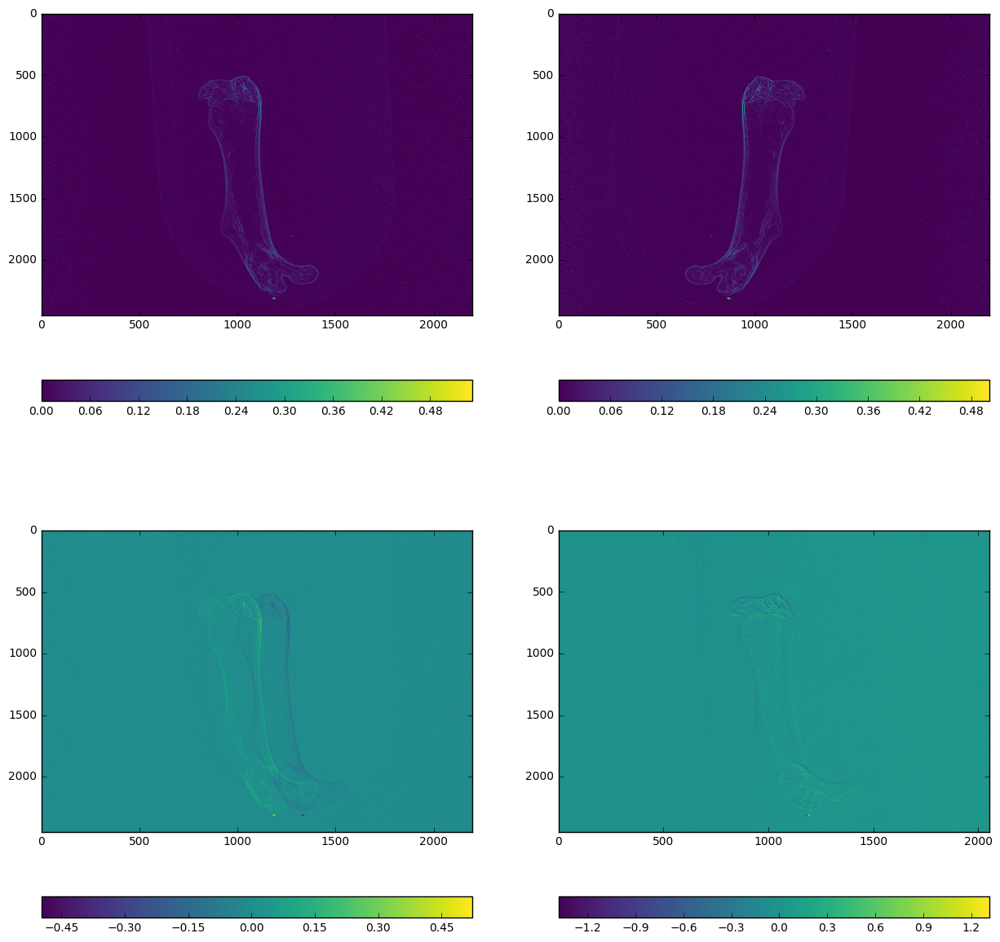

In [44]:
plt.figure(figsize=(15,15))
plt.subplot(221)
plt.imshow(data_0,cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')
plt.subplot(222)
plt.imshow(data_180,cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')
plt.subplot(223)
plt.imshow(data_0 - np.fliplr(data_180),cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')
plt.subplot(224)
# alfa = 0.1
# shift = -77
plt.imshow(tt_180-tt_0, cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')

In [19]:
print data_0.min(), data_0.max()
print data_180.min(), data_180.max()

-0.068466 2.68708
-0.0203263 2.66125


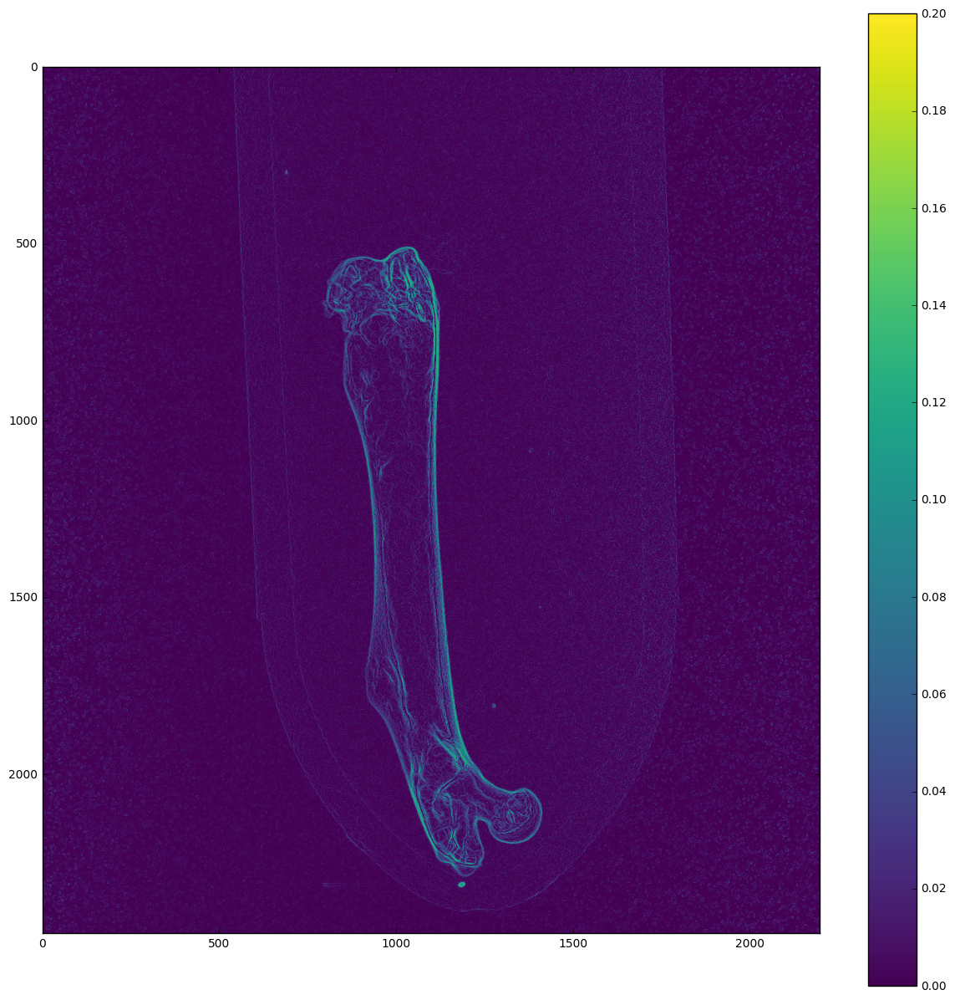

In [56]:
t = grad(cv2.medianBlur(data_0_orig,5))
thr_up = np.percentile(t[:],99.9)
t[t>thr_up]= thr_up
plt.figure(figsize=(15,15))
plt.imshow(t, cmap=plt.cm.viridis,vmin=0,vmax=0.2)
plt.colorbar()
plt.show()

In [51]:
np.percentile(data_0_orig[:],95)

0.62444019317626953

In [88]:
def get_cm(x):
    X,Y = np.meshgrid(np.arange(x.shape[1]),np.arange(x.shape[0]))
    x0 = np.sum(x*X)/np.sum(x)
    y0 = np.sum(x*Y)/np.sum(x)
    return x0, y0

In [94]:
x0,y0 = get_cm(data_0)
x1,y1 = get_cm(np.fliplr(data_180))
print x0-x1, y0-y1

-176.197426959 -6.44688103973


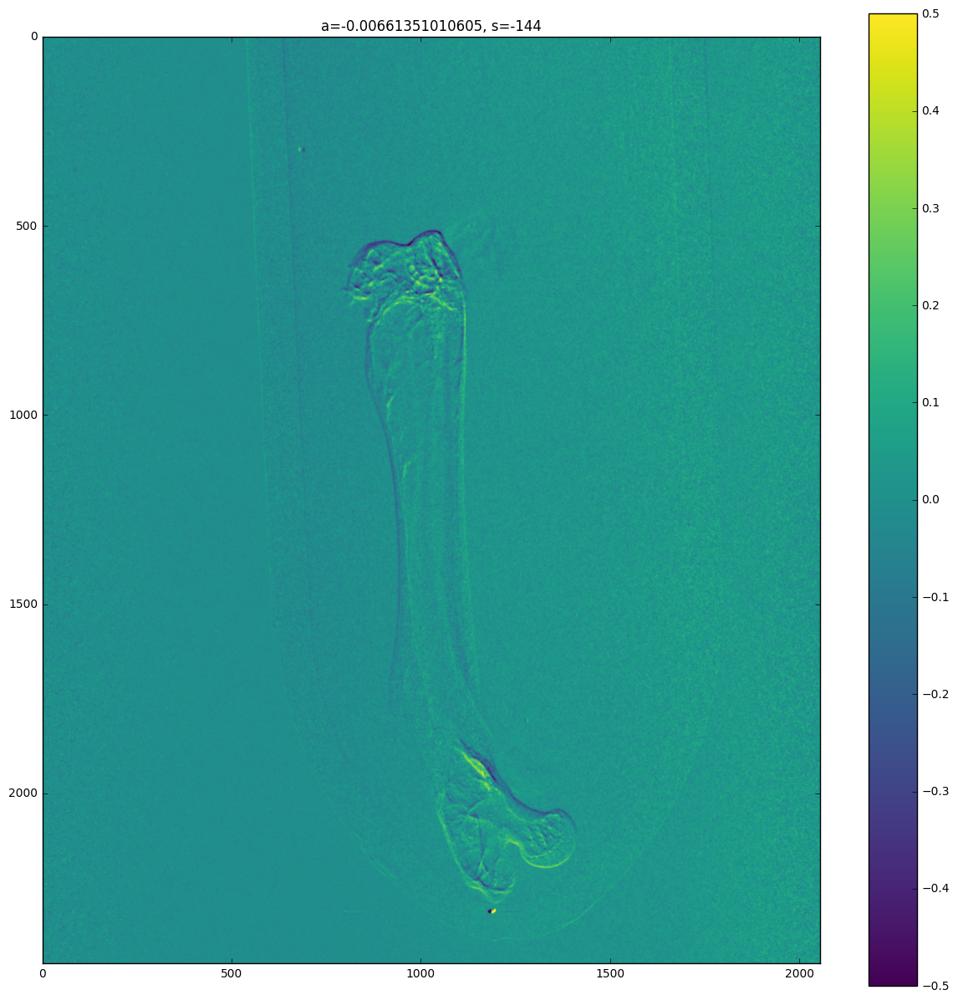

In [103]:
alfa, shift = res.x[0]*10, int(res.x[1])

if shift >= 0:
    t_180 = data_180_orig[:,shift:]
    t_0 = data_0_orig[:,shift:]
else:
    t_180 = data_180_orig[:,:shift]
    t_0 = data_0_orig[:,:shift]
    
tt_180 = np.fliplr(cv_rotate(t_180,alfa))
tt_0 = cv_rotate(t_0,alfa)
    
plt.figure(figsize=(15,15))
plt.imshow(tt_180-tt_0, cmap=plt.cm.viridis, vmin=-0.5, vmax=0.5)
plt.title('a={}, s={}'.format(alfa,shift))
plt.colorbar()
plt.show()